AI Capstone Project
Project 2: Credit card Fraud Detection
Auther: PV-J

Problem Statement

    Finance Industry is the biggest consumer of Data Scientists. It faces constant attack by fraudsters, who try to trick the system. Correctly identifying fraudulent transactions is often compared with finding needle in a haystack because of the low event rate. 
    It is important that credit card companies are able to recognize fraudulent credit card transactions so that the customers are not charged for items that they did not purchase.
    You are required to try various techniques such as supervised models with oversampling, unsupervised anomaly detection, and heuristics to get good accuracy at fraud detection.
    
Given dataset is already PCA transformed. 
The approach used for solving the problem are: 

Step -1: Load the data to understand it. Data understanding is critical since we will select the subset of features to carry out model training, and it includes types of data and its patterns. 

Step -2: Exploratory Data Analysis Study histogram to compare each variable’s data distribution pattern and skewness of the data. Make necessary data adjustments to avoid any problems while we train the model. 

Step -3: Class imbalance Study whether data is highly imbalanced between the fraudulent and non-fraudulent. We have learned four techniques to balance the data using various methods: 1. Under-sampling, oversampling, Obviouly there are other techiques like SMOTE and ADASYN is avialble. But this project is considered on random oversampling.

Step -4: Data modeling and model selection various classification models under supervised learning (Logistic Regrassion, RadomForest, XGBoost, AdaBoost) as well as deeplearning technique ANN are considered for the current study. We will use parameters such as confusion matrix, accuracy, precision, recall, and F-score, threshold dependent. Since data is imbalanced, we will also perform a deep dive into the ROC curve data to identify the threshold value (above the threshold value is fraudulent and below the threshold is not dishonest). We will calculate the F1 score, Precision, and Recall.


In [1]:
import pandas as pd
from matplotlib import pyplot as plt
from matplotlib import gridspec
import seaborn as sns
import numpy as np
import time
import copy
import sys
from datetime import datetime
from joblib import Parallel, delayed
import os
from scipy.stats import multivariate_normal
import plotly.graph_objects as go
#from chart_studio.plotly import iplot
from matplotlib.colors import ListedColormap

import tensorflow as tf
from tensorflow.keras.layers import Dense,Dropout
from tensorflow.keras.models import Sequential
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier
import tensorboard
from keras.utils.vis_utils import plot_model
from ann_visualizer.visualize import ann_viz

from sklearn.metrics import confusion_matrix, accuracy_score, classification_report, roc_curve, auc, f1_score, precision_score, recall_score
from sklearn.svm import SVC, LinearSVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.ensemble import RandomForestClassifier, BaggingClassifier, GradientBoostingClassifier, ExtraTreesClassifier, AdaBoostClassifier, IsolationForest

from imblearn.ensemble import BalancedRandomForestClassifier
from imblearn.over_sampling import RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler

from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import MinMaxScaler, Normalizer, MaxAbsScaler, StandardScaler, StandardScaler, RobustScaler
from sklearn.model_selection import GridSearchCV, cross_val_score, GridSearchCV, train_test_split, cross_validate, KFold, RandomizedSearchCV
from sklearn.pipeline import Pipeline
import xgboost as xgb
from sklearn.metrics import mean_squared_error, matthews_corrcoef
from sklearn.naive_bayes import GaussianNB, MultinomialNB
plt.style.use('ggplot')
sns.set()

In [2]:
from dask.distributed import Client

client = Client()
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: http://127.0.0.1:8787/status,
Dashboard: http://127.0.0.1:8787/status,Workers: 4
Total threads: 4,Total memory: 7.87 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:57272,Workers: 4
Dashboard: http://127.0.0.1:8787/status,Total threads: 4
Started: Just now,Total memory: 7.87 GiB
Comm: tcp://127.0.0.1:57295,Total threads: 1
Dashboard: http://127.0.0.1:57296/status,Memory: 1.97 GiB
Nanny: tcp://127.0.0.1:57277,


In [3]:
df_train_original = pd.read_csv('train_data.csv')
df_train_hidden = pd.read_csv('test_data_hidden.csv')
df_test = pd.read_csv('test_data.csv')
frame = [df_train_original,df_train_hidden]
df = pd.concat(frame)

In [4]:
df_train = copy.deepcopy(df_train_original)

In [5]:
df.shape

(284807, 31)

In [6]:
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,38355.0,1.043949,0.318555,1.045810,2.805989,-0.561113,-0.367956,0.032736,-0.042333,-0.322674,...,-0.240105,-0.680315,0.085328,0.684812,0.318620,-0.204963,0.001662,0.037894,49.67,0
1,22555.0,-1.665159,0.808440,1.805627,1.903416,-0.821627,0.934790,-0.824802,0.975890,1.747469,...,-0.335332,-0.510994,0.035839,0.147565,-0.529358,-0.566950,-0.595998,-0.220086,16.94,0
2,2431.0,-0.324096,0.601836,0.865329,-2.138000,0.294663,-1.251553,1.072114,-0.334896,1.071268,...,0.012220,0.352856,-0.341505,-0.145791,0.094194,-0.804026,0.229428,-0.021623,1.00,0
3,86773.0,-0.258270,1.217501,-0.585348,-0.875347,1.222481,-0.311027,1.073860,-0.161408,0.200665,...,-0.424626,-0.781158,0.019316,0.178614,-0.315616,0.096665,0.269740,-0.020635,10.78,0
4,127202.0,2.142162,-0.494988,-1.936511,-0.818288,-0.025213,-1.027245,-0.151627,-0.305750,-0.869482,...,0.010115,0.021722,0.079463,-0.480899,0.023846,-0.279076,-0.030121,-0.043888,39.96,0


#Check all the latent features and parameters with their mean and standard deviation. Value are close to 0 centered (mean) with unit standard deviation

In [7]:
df.iloc[:, [x for x in range(1,29)]].describe()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
count,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05
mean,1.258101e-15,3.267687e-16,-1.398954e-15,2.052588e-15,1.020915e-15,1.498711e-15,-5.776885e-16,1.204625e-16,-2.419143e-15,2.280684e-15,...,1.032802e-15,6.530820e-16,1.630241e-16,-3.296096e-16,2.535051e-16,4.486419e-15,5.301997e-16,1.680879e-15,-3.526127e-16,-1.381058e-16
std,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,1.088850e+00,...,8.140405e-01,7.709250e-01,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01
min,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,-2.458826e+01,...,-7.213527e+00,-5.449772e+01,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01
25%,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,-5.354257e-01,...,-4.562989e-01,-2.117214e-01,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02
50%,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,-9.291738e-02,...,3.734823e-03,-6.248109e-02,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02
75%,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,4.539234e-01,...,4.589494e-01,1.330408e-01,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02
max,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,2.374514e+01,...,5.591971e+00,3.942090e+01,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01


In [8]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 284807 entries, 0 to 56961
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     284

#Check the class count for each class. It’s a class Imbalance problem.

In [9]:
df.Class.value_counts()

0    284315
1       492
Name: Class, dtype: int64

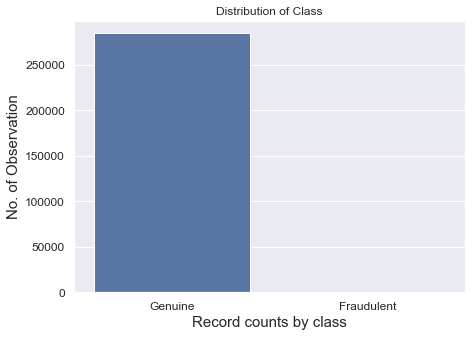

In [10]:
# Assignment of classes one and zero for visualization 

def replace_data_to_binary(x,y):
    df.Class.replace(x,y, inplace=True)
  
    
replace_data_to_binary(0, 'Genuine')
replace_data_to_binary(1, 'Fraudulent')

# Create a bar plot for the number and percentage of fraudulent vs genuine transcations

plt.figure(figsize=(7,5))
sns.countplot(x= df['Class'], data=df).set(title='Distribution of Class')
#plt.title("Distribution of Class=15)
plt.xlabel("Record counts by class", fontsize=15)
plt.ylabel("No. of Observation", fontsize=15)
plt.tick_params(labelsize=12)
plt.show()

In [11]:
#find % values of class to see wheterh data is balanced or not
(df.groupby('Class')['Class'].count()/df['Class'].count()) *100

Class
Fraudulent     0.172749
Genuine       99.827251
Name: Class, dtype: float64

Imbalance Percentage due to Fraud : 0.173047500131896

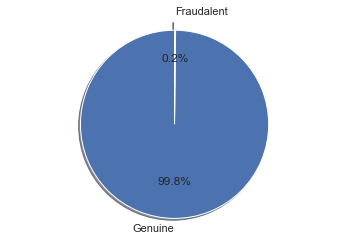

In [12]:
#plt.title('Dsitribution of the Fraudalent vs Genuine transaction in Percentages')
classes=df['Class'].value_counts()
genuine_share=classes[0]/df['Class'].count()*100
fraud_share=classes[1]/df['Class'].count()*100


labels = ['Genuine', 'Fraudalent']
sizes = [genuine_share, fraud_share]
explode = (0, 0.1) 

fig1, ax1 = plt.subplots()
ax1.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.

plt.show()

So we have 492 fraudalent transactions out of 284807 total credit card transactions.

Target variable distribution shows that we are dealing with an highly imbalanced problem as there are many more genuine transactions class as compared to the fraudalent transactions. The model would achieve high accuracy as it would mostly predict majority class — transactions which are genuine in our example. To overcome this we will use other metrics for model evaluation such as ROC-AUC , precision and recall etc

In [13]:
print("Amount details of fradulant transaction :")
print(df[df["Class"] == "Fraudulent"].Amount.describe())

print('\n')

print("Amount details of genuine transaction :")
print(df[df["Class"] == "Genuine"].Amount.describe())

Amount details of fradulant transaction :
count     492.000000
mean      122.211321
std       256.683288
min         0.000000
25%         1.000000
50%         9.250000
75%       105.890000
max      2125.870000
Name: Amount, dtype: float64


Amount details of genuine transaction :
count    284315.000000
mean         88.291022
std         250.105092
min           0.000000
25%           5.650000
50%          22.000000
75%          77.050000
max       25691.160000
Name: Amount, dtype: float64


This statistical analysis, it clearly highlights that the average money transaction for the fraudulent ones is observed more compared to genuine ones.

Text(0.5, 1.0, 'Transaction Amounts')

<Figure size 960x320 with 0 Axes>

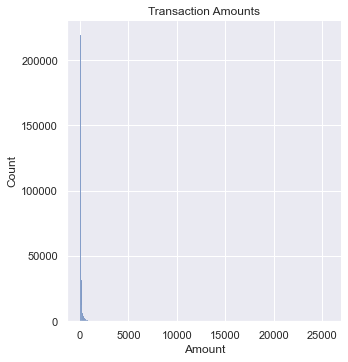

In [14]:
plt.figure(figsize=(12,4), dpi=80)
sns.displot(df['Amount'], bins=300, kde=False)
plt.ylabel('Count')
plt.title('Transaction Amounts')

Find if there is any connection between Time, Amount, and the transaction being fraudulent.

Evaluate the time vs. amount transaction between Fraudulent and Genuine


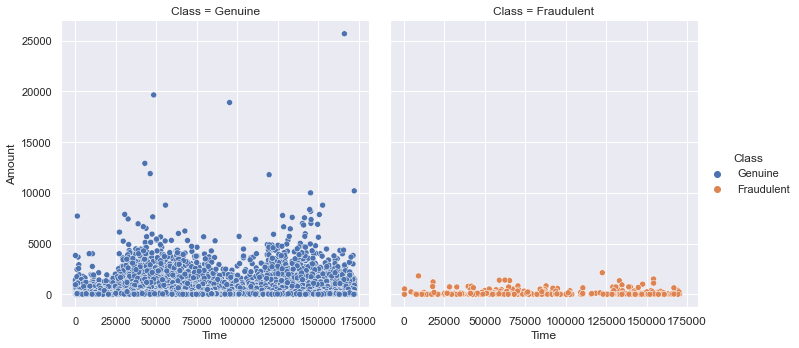

In [15]:
# Evaluate the time vs. amount transaction between fraudulent and genuine

print("Evaluate the time vs. amount transaction between Fraudulent and Genuine")
ax=sns.relplot(x="Time", y="Amount",
                 col="Class", hue="Class",
                 kind="scatter", data=df)
plt.tick_params(labelsize=12)
plt.show()

Few insights on the visualization above reveal the following:

    - The plot indicates that the approx. maximum 2.2.maximum fraud amount transaction happened on next day 
    - The first plot shows maximum genuine amount transaction went up to 25K during next day 

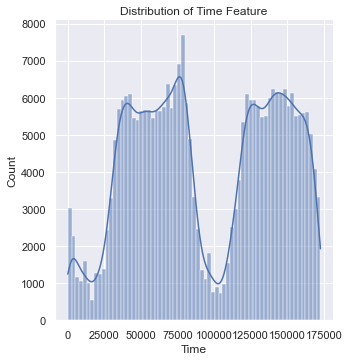

In [16]:
#visualizations of time and amount
#plt.figure(figsize=(10,8))
#plt.title('Distribution of Time Feature')
sns.displot(df['Time'], kde=True).set(title='Distribution of Time Feature')

In [17]:
# Let's convert the time from seconds to hours to ease the interpretation.
df.loc[:,'Time'] = df.Time / 3600
df['Time'].max() / 24

1.9999074074074075

Text(0.5, 1.0, 'Transaction Times')

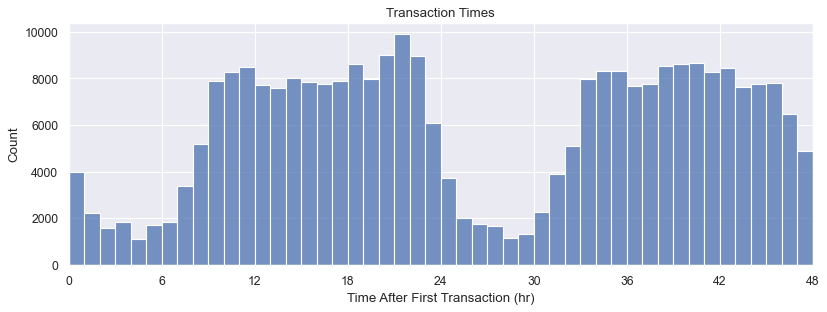

In [18]:
plt.figure(figsize=(12,4), dpi=80)
sns.histplot(df['Time'], bins=48, kde=False)
plt.xlim([0,48])
plt.xticks(np.arange(0,54,6))
plt.xlabel('Time After First Transaction (hr)')
plt.ylabel('Count')
plt.title('Transaction Times')

In [19]:
df['Time'].describe()

count    284807.000000
mean         26.337183
std          13.191152
min           0.000000
25%          15.055972
50%          23.525556
75%          38.700139
max          47.997778
Name: Time, dtype: float64

In [20]:
df['Amount'].describe()

count    284807.000000
mean         88.349619
std         250.120109
min           0.000000
25%           5.600000
50%          22.000000
75%          77.165000
max       25691.160000
Name: Amount, dtype: float64

C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


Text(0.5, 1.0, 'Transaction Amounts')

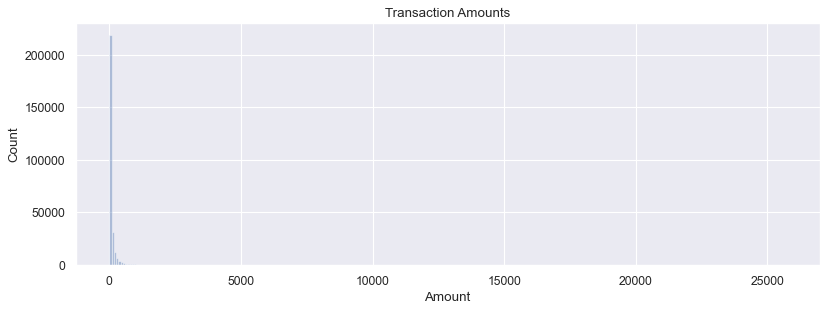

In [21]:
plt.figure(figsize=(12,4), dpi=80)
sns.distplot(df['Amount'], bins=300, kde=False)
plt.ylabel('Count')
plt.title('Transaction Amounts')

C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


Text(0.5, 1.0, 'Transaction Amounts')

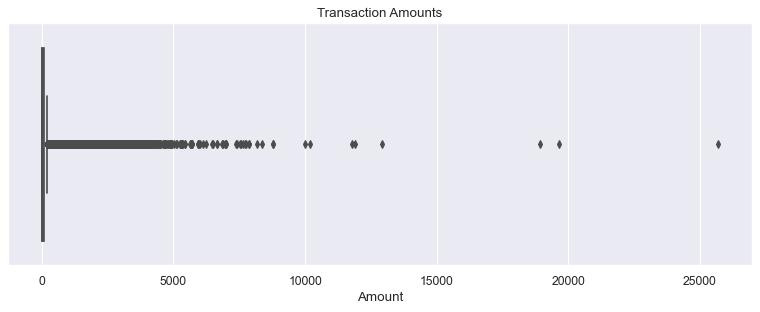

In [22]:
plt.figure(figsize=(12,4), dpi=80)
sns.boxplot(df['Amount'])
plt.title('Transaction Amounts')

In [23]:
df['Amount'].skew()

16.977724453761013

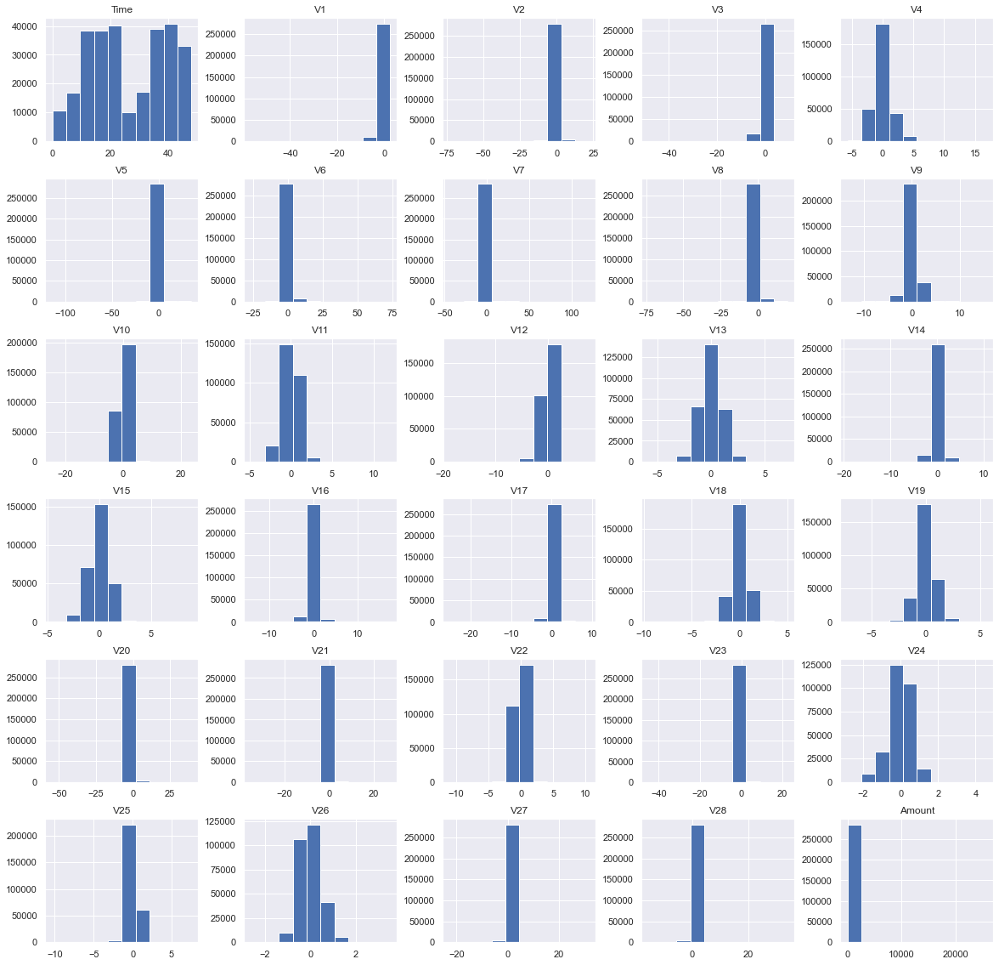

In [24]:
df.hist(figsize = (20, 20))
plt.show()

In [25]:
# Assign back to class one and zero for analysis
def replace_data_to_binary(x,y):
    df.Class.replace(x,y, inplace=True)
  
    
replace_data_to_binary('Genuine', 0)
replace_data_to_binary ('Fraudulent', 1)

In [26]:
# Since our classes are highly skewed we should make them equivalent in order to have a normal distribution of the classes.

# Lets shuffle the data before creating the subsamples

df = df.sample(frac=1)
df.drop_duplicates(keep=False, inplace=True)

# amount of fraud classes 492 rows.
fraud_df = df.loc[df['Class'] == 1]
genuine_df = df.loc[df['Class'] == 0][:394]

normal_distributed_df = pd.concat([fraud_df, genuine_df])

# Shuffle dataframe rows
new_df = normal_distributed_df.sample(frac=1, random_state=42)

new_df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
81248,35.060833,-1.141559,1.927650,-3.905356,-0.073943,-0.044858,-1.756999,-1.217416,0.364563,-2.770148,...,0.102081,-0.531496,-0.328741,0.393100,0.568435,0.786605,-0.146102,0.076211,25.00,1
212018,5.647778,-15.271362,8.326581,-22.338591,11.885313,-8.721334,-2.324307,-16.196419,0.512882,-6.333685,...,-2.356896,1.068019,1.085617,-1.039797,-0.182006,0.649921,2.149247,-1.406811,1.00,1
144300,14.982500,-2.042608,1.573578,-2.372652,-0.572676,-2.097353,-0.174142,-3.039520,-1.634233,-0.594809,...,-0.723326,0.501222,-0.696892,-0.600514,0.127547,-0.786072,0.606097,0.171697,261.87,1
51504,7.453611,-20.532751,12.373989,-23.009003,6.144821,-15.587296,-4.384491,-15.939003,13.696416,-3.948455,...,1.754608,-1.466115,-0.856779,0.125777,1.402587,-0.223755,1.574249,0.469201,99.99,1
195545,45.833889,-1.939812,-0.071000,-1.061485,-0.370376,0.181414,-0.490348,0.404628,0.246076,1.008471,...,0.083888,0.732876,-0.993429,0.813522,0.017238,-0.486815,-0.398790,-0.712743,132.70,0


In [27]:
new_df.shape

(854, 31)

C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Class', ylabel='count'>

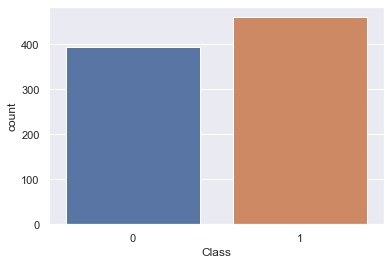

In [28]:
sns.countplot('Class', data=new_df)

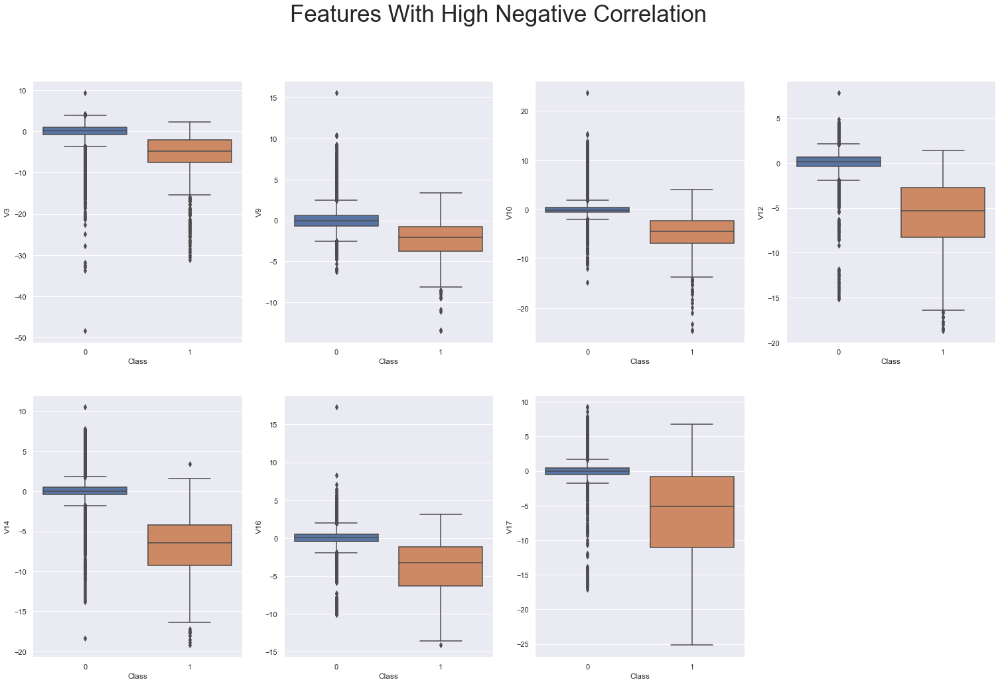

In [29]:
#visualizing the features w high negative correlation
f, axes = plt.subplots(nrows=2, ncols=4, figsize=(26,16))

f.suptitle('Features With High Negative Correlation', size=35)
sns.boxplot(x="Class", y="V3", data=df, ax=axes[0,0])
sns.boxplot(x="Class", y="V9", data=df, ax=axes[0,1])
sns.boxplot(x="Class", y="V10", data=df, ax=axes[0,2])
sns.boxplot(x="Class", y="V12", data=df, ax=axes[0,3])
sns.boxplot(x="Class", y="V14", data=df, ax=axes[1,0])
sns.boxplot(x="Class", y="V16", data=df, ax=axes[1,1])
sns.boxplot(x="Class", y="V17", data=df, ax=axes[1,2])
f.delaxes(axes[1,3])

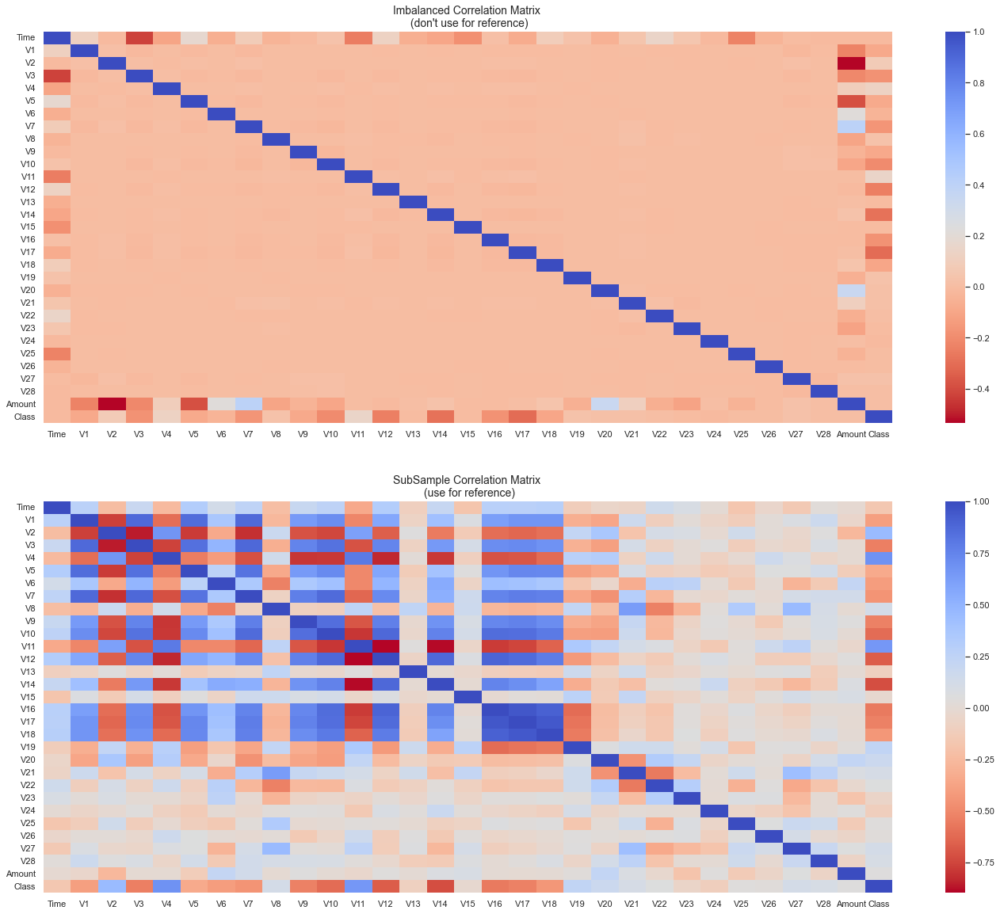

In [30]:
f, (ax1, ax2) = plt.subplots(2, 1, figsize=(24,20))

# Entire DataFrame
corr = df.corr()
sns.heatmap(corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax1)
ax1.set_title("Imbalanced Correlation Matrix \n (don't use for reference)", fontsize=14)


sub_sample_corr = new_df.corr()
sns.heatmap(sub_sample_corr, cmap='coolwarm_r', annot_kws={'size':20}, ax=ax2)
ax2.set_title('SubSample Correlation Matrix \n (use for reference)', fontsize=14)
plt.show()

As seen, the correlations cannot be properly visualized because of the imbalance in the dataset. This is because the correlation matrix is affected by the high imbalance betwen the classes. So, following figure represents subsamplig view lhat balances classes and then visualize the correlation matrix again. 

Negative and Positive Correlations can be seen in the matrix above:

    Features, V14, V12, V10 and V3 show negative correlation towards the 'Class', As, lower are these values, more likely    the transaction is Fraud.
    Features V4, V11, V2 and V19 show positive correlation. As, higher are these values, more likely the transaction is Fraud.



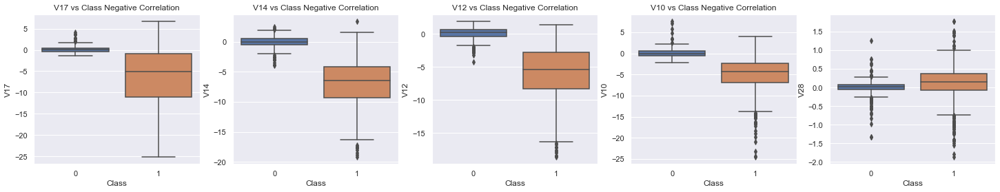

In [31]:
f, axes = plt.subplots(ncols=5, figsize=(25,4))

# Negative Correlations with our Class (The lower our feature value the more likely it will be a fraud transaction)
sns.boxplot(x="Class", y="V17", data=new_df, ax=axes[0])
axes[0].set_title('V17 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V14", data=new_df, ax=axes[1])
axes[1].set_title('V14 vs Class Negative Correlation')


sns.boxplot(x="Class", y="V12", data=new_df, ax=axes[2])
axes[2].set_title('V12 vs Class Negative Correlation')


sns.boxplot(x="Class", y="V10", data=new_df, ax=axes[3])
axes[3].set_title('V10 vs Class Negative Correlation')

sns.boxplot(x="Class", y="V28", data=new_df, ax=axes[4])
axes[3].set_title('V10 vs Class Negative Correlation')

plt.show()

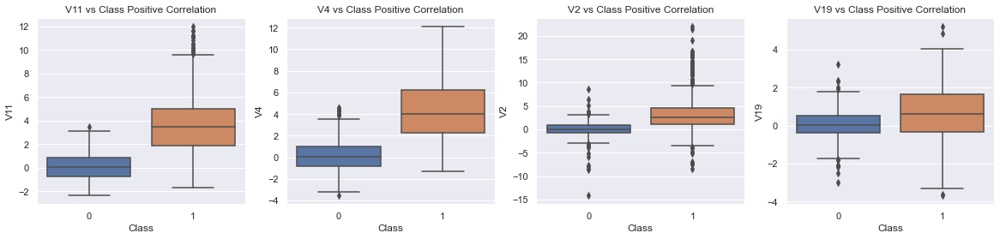

In [32]:
f, axes = plt.subplots(ncols=4, figsize=(20,4))

# Positive correlations (The higher the feature the probability increases that it will be a fraud transaction)
sns.boxplot(x="Class", y="V11", data=new_df, ax=axes[0])
axes[0].set_title('V11 vs Class Positive Correlation')

sns.boxplot(x="Class", y="V4", data=new_df, ax=axes[1])
axes[1].set_title('V4 vs Class Positive Correlation')


sns.boxplot(x="Class", y="V2", data=new_df, ax=axes[2])
axes[2].set_title('V2 vs Class Positive Correlation')


sns.boxplot(x="Class", y="V19", data=new_df, ax=axes[3])
axes[3].set_title('V19 vs Class Positive Correlation')

plt.show()

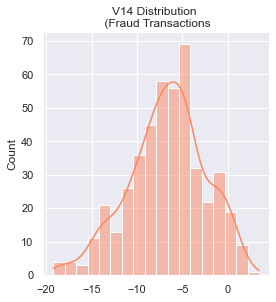

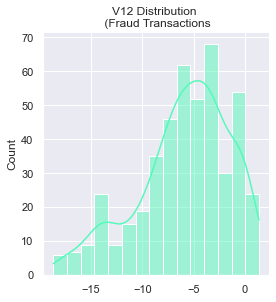

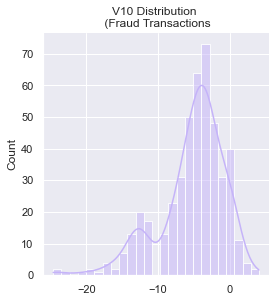

In [33]:
from scipy.stats import norm

#f, (ax1, ax2, ax3) = plt.subplots(1,3, figsize=(20, 6))
v14_fraud_dist = new_df['V14'].loc[new_df['Class'] == 1].values
#sns.relplot(x=v14_fraud_dist,kde=False,color='#FB8861')
sns.displot(data = v14_fraud_dist, kde=True, color='#FB8861', height=4).set(title='V14 Distribution \n (Fraud Transactions')
#set_title('V14 Distribution \n (Fraud Transactions)', fontsize=14)

v12_fraud_dist = new_df['V12'].loc[new_df['Class'] == 1].values
sns.displot(data=v12_fraud_dist, kde=True, color='#56F9BB', height=4).set(title='V12 Distribution \n (Fraud Transactions')
#ax2.set_title('V12 Distribution \n (Fraud Transactions)', fontsize=14)


v10_fraud_dist = new_df['V10'].loc[new_df['Class'] == 1].values
sns.displot(x=v10_fraud_dist, kde=True, color='#C5B3F9', height=4).set(title='V10 Distribution \n (Fraud Transactions')
#ax3.set_title('V10 Distribution \n (Fraud Transactions)', fontsize=14)

#plt.show()

In [34]:
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df_train['scaled_amount'] = rob_scaler.fit_transform(df_train['Amount'].values.reshape(-1,1))
df_train['scaled_time'] = rob_scaler.fit_transform(df_train['Time'].values.reshape(-1,1))

df_test['scaled_amount'] = rob_scaler.fit_transform(df_test['Amount'].values.reshape(-1,1))
df_test['scaled_time'] = rob_scaler.fit_transform(df_test['Time'].values.reshape(-1,1))

new_df['scaled_amount'] = rob_scaler.fit_transform(new_df['Amount'].values.reshape(-1,1))
new_df['scaled_time'] = rob_scaler.fit_transform(new_df['Time'].values.reshape(-1,1))

df_train.drop(['Time','Amount'], axis=1, inplace=True)
df_train.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
0,1.043949,0.318555,1.045810,2.805989,-0.561113,-0.367956,0.032736,-0.042333,-0.322674,0.499167,...,-0.680315,0.085328,0.684812,0.318620,-0.204963,0.001662,0.037894,0,0.387101,-0.543132
1,-1.665159,0.808440,1.805627,1.903416,-0.821627,0.934790,-0.824802,0.975890,1.747469,-0.658751,...,-0.510994,0.035839,0.147565,-0.529358,-0.566950,-0.595998,-0.220086,0,-0.070789,-0.728669
2,-0.324096,0.601836,0.865329,-2.138000,0.294663,-1.251553,1.072114,-0.334896,1.071268,-1.109522,...,0.352856,-0.341505,-0.145791,0.094194,-0.804026,0.229428,-0.021623,0,-0.293788,-0.964983
3,-0.258270,1.217501,-0.585348,-0.875347,1.222481,-0.311027,1.073860,-0.161408,0.200665,0.154307,...,-0.781158,0.019316,0.178614,-0.315616,0.096665,0.269740,-0.020635,0,-0.156967,0.025435
4,2.142162,-0.494988,-1.936511,-0.818288,-0.025213,-1.027245,-0.151627,-0.305750,-0.869482,0.428729,...,0.021722,0.079463,-0.480899,0.023846,-0.279076,-0.030121,-0.043888,0,0.251259,0.500188


In [35]:
df_test.drop(['Time','Amount'], axis=1, inplace=True)
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.114697,0.796303,-0.149553,-0.823011,0.878763,-0.553152,0.939259,-0.108502,0.111137,-0.390521,...,-0.335776,-0.807853,-0.055940,-1.025281,-0.369557,0.204653,0.242724,0.085713,-0.292272,0.327533
1,-0.039318,0.495784,-0.810884,0.546693,1.986257,4.386342,-1.344891,-1.743736,-0.563103,-0.616315,...,-1.377003,-0.072200,-0.197573,1.014807,1.011293,-0.167684,0.113136,0.256836,0.877791,-0.689351
2,2.275706,-1.531508,-1.021969,-1.602152,-1.220329,-0.462376,-1.196485,-0.147058,-0.950224,1.560463,...,-0.193271,-0.103533,0.150945,-0.811083,-0.197913,-0.128446,0.014197,-0.051289,0.289351,0.874557
3,1.940137,-0.357671,-1.210551,0.382523,0.050823,-0.171322,-0.109124,-0.002115,0.869258,-0.001965,...,0.157994,0.650355,0.034206,0.739535,0.223605,-0.195509,-0.012791,-0.056841,0.112541,0.615883
4,1.081395,-0.502615,1.075887,-0.543359,-1.472946,-1.065484,-0.443231,-0.143374,1.659826,-1.131238,...,0.224157,0.821209,-0.137223,0.986259,0.563228,-0.574206,0.089673,0.052036,0.641302,-0.257302


In [36]:
y = df_train.pop('Class')
x = df_train

In [37]:
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.114697,0.796303,-0.149553,-0.823011,0.878763,-0.553152,0.939259,-0.108502,0.111137,-0.390521,...,-0.335776,-0.807853,-0.055940,-1.025281,-0.369557,0.204653,0.242724,0.085713,-0.292272,0.327533
1,-0.039318,0.495784,-0.810884,0.546693,1.986257,4.386342,-1.344891,-1.743736,-0.563103,-0.616315,...,-1.377003,-0.072200,-0.197573,1.014807,1.011293,-0.167684,0.113136,0.256836,0.877791,-0.689351
2,2.275706,-1.531508,-1.021969,-1.602152,-1.220329,-0.462376,-1.196485,-0.147058,-0.950224,1.560463,...,-0.193271,-0.103533,0.150945,-0.811083,-0.197913,-0.128446,0.014197,-0.051289,0.289351,0.874557
3,1.940137,-0.357671,-1.210551,0.382523,0.050823,-0.171322,-0.109124,-0.002115,0.869258,-0.001965,...,0.157994,0.650355,0.034206,0.739535,0.223605,-0.195509,-0.012791,-0.056841,0.112541,0.615883
4,1.081395,-0.502615,1.075887,-0.543359,-1.472946,-1.065484,-0.443231,-0.143374,1.659826,-1.131238,...,0.224157,0.821209,-0.137223,0.986259,0.563228,-0.574206,0.089673,0.052036,0.641302,-0.257302


In [38]:
x = x.drop(['scaled_amount','scaled_time'],axis=1)
df_test = df_test.drop(['scaled_amount','scaled_time'],axis=1)

In [39]:
x

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28
0,1.043949,0.318555,1.045810,2.805989,-0.561113,-0.367956,0.032736,-0.042333,-0.322674,0.499167,...,-0.720944,-0.084556,-0.240105,-0.680315,0.085328,0.684812,0.318620,-0.204963,0.001662,0.037894
1,-1.665159,0.808440,1.805627,1.903416,-0.821627,0.934790,-0.824802,0.975890,1.747469,-0.658751,...,1.325588,-0.373759,-0.335332,-0.510994,0.035839,0.147565,-0.529358,-0.566950,-0.595998,-0.220086
2,-0.324096,0.601836,0.865329,-2.138000,0.294663,-1.251553,1.072114,-0.334896,1.071268,-1.109522,...,0.095583,-0.039868,0.012220,0.352856,-0.341505,-0.145791,0.094194,-0.804026,0.229428,-0.021623
3,-0.258270,1.217501,-0.585348,-0.875347,1.222481,-0.311027,1.073860,-0.161408,0.200665,0.154307,...,0.136148,0.382305,-0.424626,-0.781158,0.019316,0.178614,-0.315616,0.096665,0.269740,-0.020635
4,2.142162,-0.494988,-1.936511,-0.818288,-0.025213,-1.027245,-0.151627,-0.305750,-0.869482,0.428729,...,1.064984,0.106592,0.010115,0.021722,0.079463,-0.480899,0.023846,-0.279076,-0.030121,-0.043888
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227840,-1.993953,1.734986,-1.108037,-2.671817,1.605319,3.041992,-0.417771,1.438007,0.945437,1.017181,...,-0.575437,0.775705,-0.303532,-0.708199,0.047110,1.008409,0.234363,0.768581,0.697625,0.354542
227841,-0.440396,1.062920,1.582218,-0.029761,0.040967,-0.903627,0.730326,-0.108175,-0.513163,-0.331574,...,0.010466,0.158754,-0.215794,-0.532224,-0.024762,0.382581,-0.164620,0.068836,0.269144,0.123483
227842,0.827820,-2.649344,-3.161235,0.209209,-0.561331,-1.570386,1.612531,-0.930219,-1.318562,0.684327,...,-0.910505,0.892558,0.349915,0.002268,-0.746698,0.171847,0.247576,0.936557,-0.258164,0.037868
227843,-1.523903,-6.287060,-2.638246,1.330015,-1.672002,1.957509,1.359226,0.081727,0.753151,-0.702316,...,-1.476668,3.298835,1.329127,0.001210,-1.360187,-1.507703,-1.183927,0.578076,-0.328557,0.229935


In [40]:
x.shape

(227845, 28)

In [41]:
y.shape

(227845,)

In [42]:
clf = RandomForestClassifier(max_depth=2, random_state=0)
clf.fit(x, y)
clf.feature_importances_

array([0.00000000e+00, 6.64079693e-04, 1.64016769e-02, 1.10726952e-02,
       1.12833261e-03, 8.12053307e-06, 1.54202198e-02, 2.80607340e-03,
       5.20390042e-02, 8.13971343e-02, 9.74799949e-02, 2.41933240e-01,
       0.00000000e+00, 1.11869504e-01, 0.00000000e+00, 5.89654101e-02,
       2.45464979e-01, 5.09558577e-02, 1.16757491e-03, 6.82818632e-04,
       2.84711088e-03, 4.82174136e-04, 0.00000000e+00, 0.00000000e+00,
       1.21449817e-04, 6.36458207e-03, 1.37594009e-05, 7.14208201e-04])

In [43]:
xb = xgb.XGBRFRegressor()
xb.fit(x, y)
xb.feature_importances_

array([0.00590311, 0.00758237, 0.01458201, 0.0052354 , 0.008207  ,
       0.01208481, 0.01763585, 0.01409305, 0.0171611 , 0.05363986,
       0.00900123, 0.17756835, 0.00786138, 0.03685673, 0.00681611,
       0.02320627, 0.423038  , 0.01739214, 0.00536551, 0.0124709 ,
       0.0091796 , 0.01167752, 0.00134881, 0.0155044 , 0.00763219,
       0.03062685, 0.03456058, 0.01376884], dtype=float32)

In [44]:
def roc_curve_plots(y_test,y_predict_wrf,X_test,model):
    print(classification_report(y_test,y_predict_wrf),"\n")
    neigh_prob_linear=model.predict_proba(X_test)
    neigh_prob_linear1=neigh_prob_linear[:,1]
    fpr,tpr,thresh=roc_curve(y_test,neigh_prob_linear1)
    roc_auc_neigh=auc(fpr,tpr)

    plt.figure(dpi=80)
    plt.title("ROC Curve")
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.plot(fpr,tpr,'b',label='AUC Score = %0.2f'%roc_auc_neigh)
    plt.plot(fpr,fpr,'r--',color='red')
    plt.legend()

In [45]:
def model_accuracies(model,x_feature,y_label,X_test,df_test_len):
    # X_train, X_test, y_train, y_test = train_test_split(x_feature, y_label, test_size=0.33, random_state=42)
    print(x_feature.shape,y_label.shape,X_test.shape)
    y_pred = model.fit(x_feature, y_label).predict(X_test)
    print("df_test_len", df_test_len)
    cm_wrf = confusion_matrix(y_pred,y_label.iloc[:df_test_len])
    print("f1_score       : ", f1_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("precision_score: ", precision_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("recall_score   : ", recall_score(y_label.iloc[:df_test_len], y_pred, average="macro"))
    print("\nAccuracy Score :",accuracy_score(y_pred,y_label.iloc[:df_test_len]))
    roc_curve_plots(y_label.iloc[:df_test_len],y_pred,X_test,model)

Use techniques like undersampling or oversampling before running Naïve Bayes, Logistic Regression or SVM.

    Oversampling or undersampling can be used to tackle the class imbalance problem
    Oversampling increases the prior probability of imbalanced class and in case of other classifiers, error gets multiplied as the low-proportionate class is mimicked multiple times.

In [46]:
ros = RandomOverSampler(random_state=42)
X_ros, y_ros = ros.fit_resample(x, y)

In [47]:
print(X_ros.shape, y_ros.shape)

(454902, 28) (454902,)


In [48]:
rus = RandomUnderSampler(random_state=42)
X_rus, y_rus = rus.fit_resample(x, y)

In [49]:
print(X_rus.shape, y_rus.shape)

(788, 28) (788,)


(454902, 28) (454902,) (56962, 28)
df_test_len 56962
f1_score       :  0.49453055317909606
precision_score:  0.5000795832882818
recall_score   :  0.5011726428172394

Accuracy Score : 0.9712439872195499
              precision    recall  f1-score   support

           0       1.00      0.97      0.99     56860
           1       0.00      0.03      0.00       102

    accuracy                           0.97     56962
   macro avg       0.50      0.50      0.49     56962
weighted avg       1.00      0.97      0.98     56962
 



C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3361032827.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr,fpr,'r--',color='red')


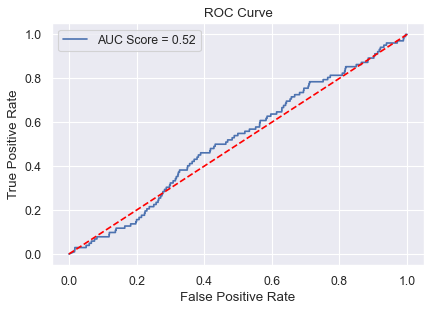

In [50]:
gnb = GaussianNB()
df_test_len = df_test.shape[0]
# print(df_test.sample(n=df_test_len))
model_accuracies(model = gnb, x_feature=X_ros,y_label= y_ros, X_test=df_test, df_test_len=df_test_len)

(454902, 28) (454902,) (56962, 28)
df_test_len 56962
f1_score       :  0.4942775108100917
precision_score:  0.49946433771292903
recall_score   :  0.49310104625740553

Accuracy Score : 0.9746673220743653
              precision    recall  f1-score   support

           0       1.00      0.98      0.99     56860
           1       0.00      0.01      0.00       102

    accuracy                           0.97     56962
   macro avg       0.50      0.49      0.49     56962
weighted avg       1.00      0.97      0.99     56962
 



C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3361032827.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr,fpr,'r--',color='red')


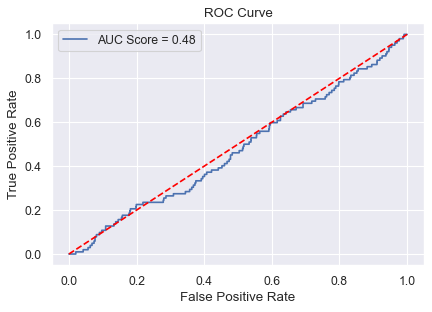

In [51]:
lr = LogisticRegression(class_weight ='balanced')
model_accuracies(model = lr, x_feature=X_ros,y_label= y_ros,X_test=df_test,df_test_len=df_test.shape[0])

(788, 28) (788,) (788, 28)
df_test_len 788
f1_score       :  0.35340099330598146
precision_score:  0.45206112814522803
recall_score   :  0.4936548223350254

Accuracy Score : 0.4936548223350254
              precision    recall  f1-score   support

           0       0.50      0.96      0.65       394
           1       0.41      0.03      0.05       394

    accuracy                           0.49       788
   macro avg       0.45      0.49      0.35       788
weighted avg       0.45      0.49      0.35       788
 



C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3361032827.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr,fpr,'r--',color='red')


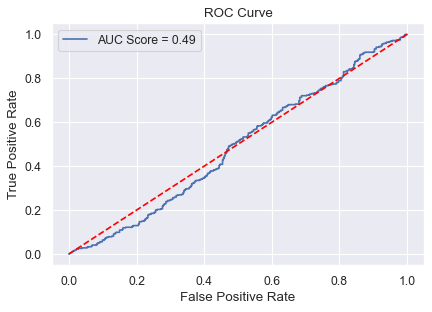

In [52]:
gnb = GaussianNB()
model_accuracies(model = gnb, x_feature=X_rus,y_label= y_rus, X_test=df_test.iloc[:788],df_test_len = 788)

(788, 28) (788,) (788, 28)
df_test_len 788
f1_score       :  0.3699581963553715
precision_score:  0.5
recall_score   :  0.5

Accuracy Score : 0.5
              precision    recall  f1-score   support

           0       0.50      0.95      0.66       394
           1       0.50      0.05      0.08       394

    accuracy                           0.50       788
   macro avg       0.50      0.50      0.37       788
weighted avg       0.50      0.50      0.37       788
 



C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3361032827.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr,fpr,'r--',color='red')


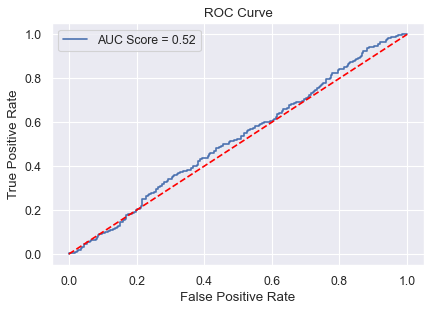

In [53]:
lr = LogisticRegression(class_weight ='balanced')
model_accuracies(model = lr, x_feature=X_rus,y_label= y_rus, X_test=df_test.iloc[:788],df_test_len = 788)

Following are the matrices for evaluating the model performance: Precision, Recall, F1-Score, AUC-ROC curve. Use F1-Score as the evaluation criteria for this project.

    Accuracy can be used when the class distribution is similar while F1-score is a better metric when there are imbalanced classes as in the above case.
    Accuracy is used when the True Positives and True negatives are more important while F1-score is used when the False Negatives and False Positives are crucial

    F1 score for undersampled data for Model Logistic Regression and Nave bayes is more.



Try out models like Naive Bayes, Logistic Regression or SVM. Find out which one performs the best

In [54]:
def run_parllel_job_cross_val(pipeline,x,y):
    big_future_x = client.scatter(x)
    big_future_y = client.scatter(y)
    a = client.submit(cross_val_score,pipeline, big_future_x, big_future_y, cv=5, scoring='f1', n_jobs=5)
    return a.result().mean()

In [55]:
pipe_lr = Pipeline(steps=[('scaler', StandardScaler()), ('lr', LogisticRegression())])
output = run_parllel_job_cross_val(pipe_lr,x,y)
output

0.7333977375000338

In [56]:
pipe_svc = Pipeline(steps=[('scaler', StandardScaler()), ('svc', SVC())])
output = run_parllel_job_cross_val(pipe_svc,x,y)
output

0.7736833523239918

In [57]:
pipe_nb = Pipeline(steps=[('nb', GaussianNB())])
output = run_parllel_job_cross_val(pipe_nb,x,y)
output

0.11600483849746838

Ensemble Learning

Random forest

In [58]:
wrf = RandomForestClassifier(class_weight='balanced_subsample', random_state=42, n_jobs=5)
wrf.fit(x, y)

RandomForestClassifier(class_weight='balanced_subsample', n_jobs=5,
                       random_state=42)

Accuracy Score : 0.996875109722271


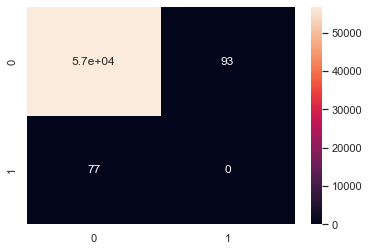

In [59]:
y_predict_wrf = wrf.predict(df_test)
cm_wrf = confusion_matrix(y_predict_wrf,y.sample(n = 56962))
sns.heatmap(cm_wrf,annot=True)
print("Accuracy Score :",accuracy_score(y_predict_wrf,y.sample(n = 56962)))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     56856
           1       0.00      0.00      0.00       106

    accuracy                           1.00     56962
   macro avg       0.50      0.50      0.50     56962
weighted avg       1.00      1.00      1.00     56962
 



C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3361032827.py:13: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "r--" (-> color='r'). The keyword argument will take precedence.
  plt.plot(fpr,fpr,'r--',color='red')


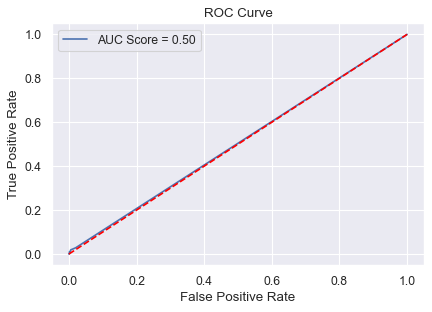

In [60]:
roc_curve_plots(y.sample(n = 56962),y_predict_wrf,df_test,wrf)

In [61]:
y_label = y.iloc[:df_test_len]

In [62]:
print("f1_score       : ", f1_score(y_label, y_predict_wrf, average="macro"))
print("precision_score: ", precision_score(y_label, y_predict_wrf, average="macro"))
print("recall_score   : ", recall_score(y_label, y_predict_wrf, average="macro"))

f1_score       :  0.4992131522264715
precision_score:  0.49910345433769887
recall_score   :  0.49932289834681676


XGBoost

Suppose, the dataset has 90 observations of negative class and 10 observations of positive class, then ideal value of scale_pos_weight should be 9.

In [63]:
y.value_counts(normalize=True) * 100

0    99.827075
1     0.172925
Name: Class, dtype: float64

In [64]:
xb = xgb.XGBClassifier(learning_rate=0.001, max_depth=1, n_estimators=1, scale_pos_weight=99.827, n_jobs=5)

In [65]:
xb.fit(x, y,eval_metric='logloss',verbose=True)

C:\Users\PREETI\anaconda3\lib\site-packages\xgboost\sklearn.py:861: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(


XGBClassifier(base_score=0.5, booster='gbtree', callbacks=None,
              colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
              early_stopping_rounds=None, enable_categorical=False,
              eval_metric=None, feature_types=None, gamma=0, gpu_id=-1,
              grow_policy='depthwise', importance_type=None,
              interaction_constraints='', learning_rate=0.001, max_bin=256,
              max_cat_threshold=64, max_cat_to_onehot=4, max_delta_step=0,
              max_depth=1, max_leaves=0, min_child_weight=1, missing=nan,
              monotone_constraints='()', n_estimators=1, n_jobs=5,
              num_parallel_tree=1, predictor='auto', random_state=0, ...)

Accuracy Score : 0.9933288859239493
f1_score       :  0.4983487305040115


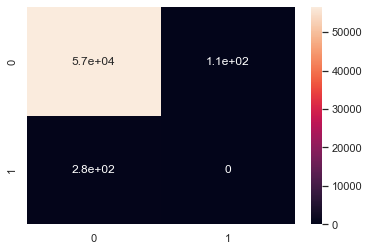

In [66]:
xgb_predict=xb.predict(df_test)
cm_xgb = confusion_matrix(xgb_predict,y.sample(n = 56962))
sns.heatmap(cm_xgb,annot=True)
print("Accuracy Score :",accuracy_score(xgb_predict,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), xgb_predict, average="macro"))

Bagging Classifier

Accuracy Score : 0.9972788876795057
f1_score       :  0.49924837147152157


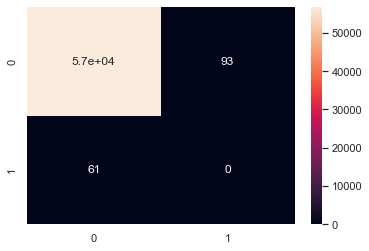

In [67]:
BC_clf = BaggingClassifier(base_estimator=SVC(),
                        n_estimators=10, random_state=0, n_jobs=5).fit(x, y)
BC_pred = BC_clf.predict(df_test)
cm_bc = confusion_matrix(BC_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_pred, average="macro"))

Accuracy Score : 0.996857554158913
f1_score       :  0.49921315222647156


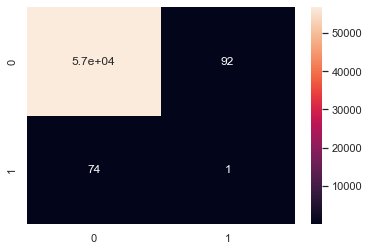

In [68]:
BC_RFC = BaggingClassifier(base_estimator=RandomForestClassifier(class_weight='balanced_subsample'),
                        n_estimators=10, random_state=0, n_jobs=5).fit(x, y)
BC_rfc_pred = BC_RFC.predict(df_test)
cm_BC_rf = confusion_matrix(BC_rfc_pred,y.sample(n = 56962))
sns.heatmap(cm_BC_rf,annot=True)
print("Accuracy Score :",accuracy_score(BC_rfc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_rfc_pred, average="macro"))

GRADIENT Bossing Classifier

Accuracy Score : 0.9966819985253327
f1_score       :  0.49933639791514683


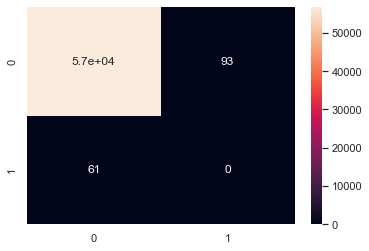

In [72]:
GBC = GradientBoostingClassifier(random_state=0, loss='log_loss', learning_rate=0.01, criterion='squared_error')
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

Extra Trees Classifier

Accuracy Score : 0.996892665285629
f1_score       :  0.49925717550876886


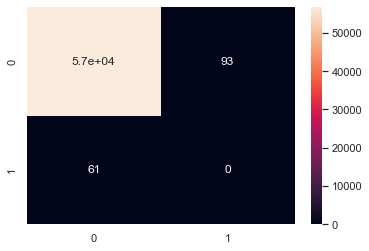

In [73]:
GBC = ExtraTreesClassifier(n_estimators=100, random_state=0, class_weight='balanced', n_jobs = 6)
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

ADABoost

Accuracy Score : 0.9966293318352586
f1_score       :  0.49919113768243356


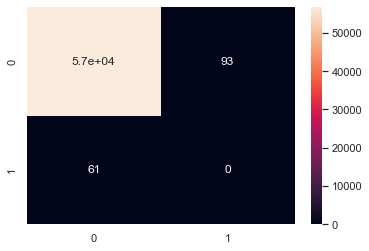

In [74]:
GBC = AdaBoostClassifier(n_estimators=100, random_state=0)
GBC.fit(x, y)
BC_gbc_pred = GBC.predict(df_test)
cm_gbc = confusion_matrix(BC_gbc_pred,y.sample(n = 56962))
sns.heatmap(cm_bc,annot=True)
print("Accuracy Score :",accuracy_score(BC_gbc_pred,y.sample(n = 56962)))
print("f1_score       : ", f1_score(y.sample(n = 56962), BC_gbc_pred, average="macro"))

ANN

In [75]:
new_df.drop(['Time','Amount'], axis=1, inplace=True)
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
81248,-1.141559,1.927650,-3.905356,-0.073943,-0.044858,-1.756999,-1.217416,0.364563,-2.770148,-3.216188,...,-0.531496,-0.328741,0.393100,0.568435,0.786605,-0.146102,0.076211,1,0.054230,0.542101
212018,-15.271362,8.326581,-22.338591,11.885313,-8.721334,-2.324307,-16.196419,0.512882,-6.333685,-13.175198,...,1.068019,1.085617,-1.039797,-0.182006,0.649921,2.149247,-1.406811,1,-0.189499,-0.645499
144300,-2.042608,1.573578,-2.372652,-0.572676,-2.097353,-0.174142,-3.039520,-1.634233,-0.594809,-5.459602,...,0.501222,-0.696892,-0.600514,0.127547,-0.786072,0.606097,0.171697,1,2.459734,-0.268594
51504,-20.532751,12.373989,-23.009003,6.144821,-15.587296,-4.384491,-15.939003,13.696416,-3.948455,-8.789723,...,-1.466115,-0.856779,0.125777,1.402587,-0.223755,1.574249,0.469201,1,0.815781,-0.572585
195545,-1.939812,-0.071000,-1.061485,-0.370376,0.181414,-0.490348,0.404628,0.246076,1.008471,-0.899463,...,0.732876,-0.993429,0.813522,0.017238,-0.486815,-0.398790,-0.712743,0,1.147964,0.977081


In [76]:
new_df.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
81248,-1.141559,1.927650,-3.905356,-0.073943,-0.044858,-1.756999,-1.217416,0.364563,-2.770148,-3.216188,...,-0.531496,-0.328741,0.393100,0.568435,0.786605,-0.146102,0.076211,1,0.054230,0.542101
212018,-15.271362,8.326581,-22.338591,11.885313,-8.721334,-2.324307,-16.196419,0.512882,-6.333685,-13.175198,...,1.068019,1.085617,-1.039797,-0.182006,0.649921,2.149247,-1.406811,1,-0.189499,-0.645499
144300,-2.042608,1.573578,-2.372652,-0.572676,-2.097353,-0.174142,-3.039520,-1.634233,-0.594809,-5.459602,...,0.501222,-0.696892,-0.600514,0.127547,-0.786072,0.606097,0.171697,1,2.459734,-0.268594
51504,-20.532751,12.373989,-23.009003,6.144821,-15.587296,-4.384491,-15.939003,13.696416,-3.948455,-8.789723,...,-1.466115,-0.856779,0.125777,1.402587,-0.223755,1.574249,0.469201,1,0.815781,-0.572585
195545,-1.939812,-0.071000,-1.061485,-0.370376,0.181414,-0.490348,0.404628,0.246076,1.008471,-0.899463,...,0.732876,-0.993429,0.813522,0.017238,-0.486815,-0.398790,-0.712743,0,1.147964,0.977081


In [77]:
df.drop_duplicates(keep=False, inplace=True)

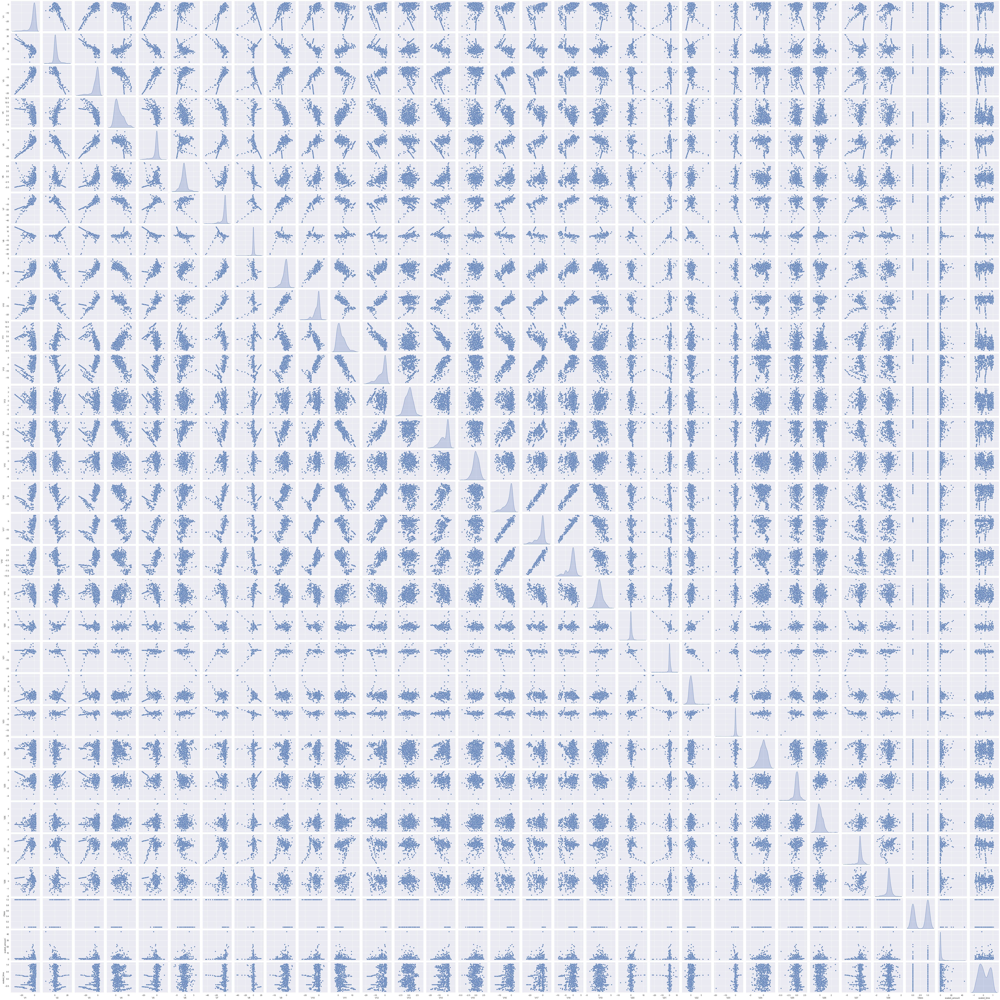

In [78]:
sns.pairplot(new_df, diag_kind="kde")

In [79]:
new_df.shape

(854, 31)

In [80]:
y_label = new_df.pop('Class')
x_feat = new_df

In [81]:
y_label.head()

81248     1
212018    1
144300    1
51504     1
195545    0
Name: Class, dtype: int64

In [82]:
x_feat.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
81248,-1.141559,1.927650,-3.905356,-0.073943,-0.044858,-1.756999,-1.217416,0.364563,-2.770148,-3.216188,...,0.102081,-0.531496,-0.328741,0.393100,0.568435,0.786605,-0.146102,0.076211,0.054230,0.542101
212018,-15.271362,8.326581,-22.338591,11.885313,-8.721334,-2.324307,-16.196419,0.512882,-6.333685,-13.175198,...,-2.356896,1.068019,1.085617,-1.039797,-0.182006,0.649921,2.149247,-1.406811,-0.189499,-0.645499
144300,-2.042608,1.573578,-2.372652,-0.572676,-2.097353,-0.174142,-3.039520,-1.634233,-0.594809,-5.459602,...,-0.723326,0.501222,-0.696892,-0.600514,0.127547,-0.786072,0.606097,0.171697,2.459734,-0.268594
51504,-20.532751,12.373989,-23.009003,6.144821,-15.587296,-4.384491,-15.939003,13.696416,-3.948455,-8.789723,...,1.754608,-1.466115,-0.856779,0.125777,1.402587,-0.223755,1.574249,0.469201,0.815781,-0.572585
195545,-1.939812,-0.071000,-1.061485,-0.370376,0.181414,-0.490348,0.404628,0.246076,1.008471,-0.899463,...,0.083888,0.732876,-0.993429,0.813522,0.017238,-0.486815,-0.398790,-0.712743,1.147964,0.977081


In [83]:
x_train, x_test, y_train, y_test = train_test_split(x_feat, y_label, test_size=0.30, random_state=42, shuffle=True)

In [84]:
x_train.shape,x_test.shape,y_train.shape,y_test.shape

((597, 30), (257, 30), (597,), (257,))

a) Fine-tune number of layers
b) Number of Neurons in each layers
Sigmoid is used for binary classification neural network. Because it exists between (0 to 1). Therefore, it is especially used for models where we have to predict the probability as an output. Since probability of anything exists only between the range of 0 and 1, sigmoid is the right choice. The function is differentiable.
ReLU stands for Rectified Linear Unit. The main advantage of using the ReLU function over other activation functions is that it does not activate all the neurons at the same time. ReLU provides just enough non-linearity so that it is nearly as simple as a linear activation, but this non-linearity opens the door for extremely complex representations. Because unlike in the linear case, the more you stack non-linear ReLUs, the more it becomes non-linear.

In [86]:
def create_model(optimizer='Adam',learn_rate=0.01, dropout_rate=0.2):
    model = Sequential()
    model.add(Dense(units =256,activation='relu',input_shape=(30,)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(Dense(units=256,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=128,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=64,kernel_initializer='normal',activation='relu'))
    model.add(Dropout(dropout_rate))
    model.add(Dense(units=32,kernel_initializer='normal',activation='relu'))
    model.add(Dense(units=16,kernel_initializer='normal',activation='relu'))
    model.add(Dense(units=1,activation='sigmoid'))
#     if not optimizer:
#         optimizer = tf.keras.optimizers.Adam(lr=learn_rate)
    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy',tf.keras.metrics.AUC()])
    return model

create_model().summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 256)               7936      
                                                                 
 batch_normalization (BatchN  (None, 256)              1024      
 ormalization)                                                   
                                                                 
 dense_1 (Dense)             (None, 256)               65792     
                                                                 
 dropout (Dropout)           (None, 256)               0         
                                                                 
 dense_2 (Dense)             (None, 128)               32896     
                                                                 
 dropout_1 (Dropout)         (None, 128)               0         
                                                        

In [87]:
# tf.keras.metrics.AUC(),tf.keras.metrics.Precision(),tf.keras.metrics.Recall()
adam_optimizer = tf.keras.optimizers.Adam(learning_rate=0.01)
create_model().compile(optimizer=adam_optimizer, loss='binary_crossentropy', metrics=['accuracy'])

In [88]:
# print(os.getcwd())
logdir="logs/fit/"+ datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=logdir)
history = create_model().fit(x_train,y_train,epochs=20,batch_size=45,validation_data=(x_test, y_test))

Epoch 1/20
14/14 [==============================] - 6s 57ms/step - loss: 0.6150 - accuracy: 0.8208 - auc_2: 0.8967 - val_loss: 0.4294 - val_accuracy: 0.7393 - val_auc_2: 0.9610
Epoch 2/20
14/14 [==============================] - 0s 14ms/step - loss: 0.2544 - accuracy: 0.9146 - auc_2: 0.9612 - val_loss: 0.3200 - val_accuracy: 0.8677 - val_auc_2: 0.9706
Epoch 3/20
14/14 [==============================] - 0s 13ms/step - loss: 0.1845 - accuracy: 0.9196 - auc_2: 0.9761 - val_loss: 0.2458 - val_accuracy: 0.9105 - val_auc_2: 0.9733
Epoch 4/20
14/14 [==============================] - 0s 10ms/step - loss: 0.1752 - accuracy: 0.9313 - auc_2: 0.9792 - val_loss: 0.2407 - val_accuracy: 0.9377 - val_auc_2: 0.9714
Epoch 5/20
14/14 [==============================] - 0s 11ms/step - loss: 0.1317 - accuracy: 0.9531 - auc_2: 0.9903 - val_loss: 0.2199 - val_accuracy: 0.9339 - val_auc_2: 0.9720
Epoch 6/20
14/14 [==============================] - 0s 11ms/step - loss: 0.1357 - accuracy: 0.9548 - auc_2: 0.9833 

Loss = Amount of loss during training of model has decreased from 0.62 to 0.02 as no. of ephoch has increased
Accuracy = Conversely during traing phase accuracy has increased from .82 to .98 as no. of ephoch has incresed.


In [93]:
df_test = pd.read_csv('test_data.csv')
std_scaler = StIn beggining oandardScaler()
rob_scaler = RobustScaler()

In [95]:
df_test['scaled_amount'] = rob_scaler.fit_transform(df_test['Amount'].values.reshape(-1,1))
df_test['scaled_time'] = rob_scaler.fit_transform(df_test['Time'].values.reshape(-1,1))


In [96]:
df_test.drop(['Time','Amount'], axis=1, inplace=True)
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.114697,0.796303,-0.149553,-0.823011,0.878763,-0.553152,0.939259,-0.108502,0.111137,-0.390521,...,-0.335776,-0.807853,-0.055940,-1.025281,-0.369557,0.204653,0.242724,0.085713,-0.292272,0.327533
1,-0.039318,0.495784,-0.810884,0.546693,1.986257,4.386342,-1.344891,-1.743736,-0.563103,-0.616315,...,-1.377003,-0.072200,-0.197573,1.014807,1.011293,-0.167684,0.113136,0.256836,0.877791,-0.689351
2,2.275706,-1.531508,-1.021969,-1.602152,-1.220329,-0.462376,-1.196485,-0.147058,-0.950224,1.560463,...,-0.193271,-0.103533,0.150945,-0.811083,-0.197913,-0.128446,0.014197,-0.051289,0.289351,0.874557
3,1.940137,-0.357671,-1.210551,0.382523,0.050823,-0.171322,-0.109124,-0.002115,0.869258,-0.001965,...,0.157994,0.650355,0.034206,0.739535,0.223605,-0.195509,-0.012791,-0.056841,0.112541,0.615883
4,1.081395,-0.502615,1.075887,-0.543359,-1.472946,-1.065484,-0.443231,-0.143374,1.659826,-1.131238,...,0.224157,0.821209,-0.137223,0.986259,0.563228,-0.574206,0.089673,0.052036,0.641302,-0.257302


In [97]:
# df_train_hidden
std_scaler = StandardScaler()
rob_scaler = RobustScaler()

df_train_hidden['scaled_amount'] = rob_scaler.fit_transform(df_train_hidden['Amount'].values.reshape(-1,1))
df_train_hidden['scaled_time'] = rob_scaler.fit_transform(df_train_hidden['Time'].values.reshape(-1,1))

df_train_hidden.drop(['Time','Amount'], axis=1, inplace=True)
df_train_hidden.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V22,V23,V24,V25,V26,V27,V28,Class,scaled_amount,scaled_time
0,0.114697,0.796303,-0.149553,-0.823011,0.878763,-0.553152,0.939259,-0.108502,0.111137,-0.390521,...,-0.807853,-0.055940,-1.025281,-0.369557,0.204653,0.242724,0.085713,0,-0.292272,0.327533
1,-0.039318,0.495784,-0.810884,0.546693,1.986257,4.386342,-1.344891,-1.743736,-0.563103,-0.616315,...,-0.072200,-0.197573,1.014807,1.011293,-0.167684,0.113136,0.256836,0,0.877791,-0.689351
2,2.275706,-1.531508,-1.021969,-1.602152,-1.220329,-0.462376,-1.196485,-0.147058,-0.950224,1.560463,...,-0.103533,0.150945,-0.811083,-0.197913,-0.128446,0.014197,-0.051289,0,0.289351,0.874557
3,1.940137,-0.357671,-1.210551,0.382523,0.050823,-0.171322,-0.109124,-0.002115,0.869258,-0.001965,...,0.650355,0.034206,0.739535,0.223605,-0.195509,-0.012791,-0.056841,0,0.112541,0.615883
4,1.081395,-0.502615,1.075887,-0.543359,-1.472946,-1.065484,-0.443231,-0.143374,1.659826,-1.131238,...,0.821209,-0.137223,0.986259,0.563228,-0.574206,0.089673,0.052036,0,0.641302,-0.257302


Predictions

In [98]:
ann_predictions = create_model().predict(df_test)

1781/1781 [==============================] - 4s 2ms/step


In [99]:
df_train_hidden_pred = df_train_hidden.drop(['Class'], axis=1)
ann_predictions_hidden = create_model().predict(df_train_hidden_pred)

1781/1781 [==============================] - 4s 2ms/step


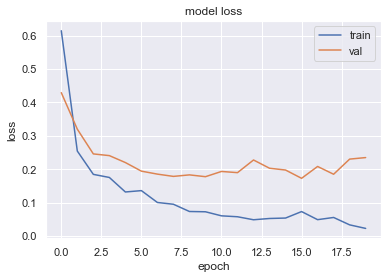

In [100]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='upper right')
plt.show()

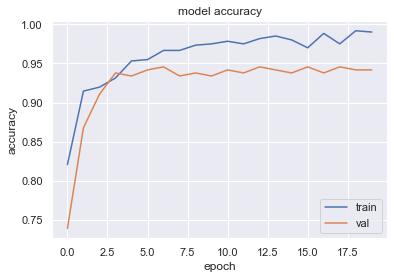

In [101]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'val'], loc='lower right')
plt.show()

In [102]:
df_test.head()

,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,...,V21,V22,V23,V24,V25,V26,V27,V28,scaled_amount,scaled_time
0,0.114697,0.796303,-0.149553,-0.823011,0.878763,-0.553152,0.939259,-0.108502,0.111137,-0.390521,...,-0.335776,-0.807853,-0.055940,-1.025281,-0.369557,0.204653,0.242724,0.085713,-0.292272,0.327533
1,-0.039318,0.495784,-0.810884,0.546693,1.986257,4.386342,-1.344891,-1.743736,-0.563103,-0.616315,...,-1.377003,-0.072200,-0.197573,1.014807,1.011293,-0.167684,0.113136,0.256836,0.877791,-0.689351
2,2.275706,-1.531508,-1.021969,-1.602152,-1.220329,-0.462376,-1.196485,-0.147058,-0.950224,1.560463,...,-0.193271,-0.103533,0.150945,-0.811083,-0.197913,-0.128446,0.014197,-0.051289,0.289351,0.874557
3,1.940137,-0.357671,-1.210551,0.382523,0.050823,-0.171322,-0.109124,-0.002115,0.869258,-0.001965,...,0.157994,0.650355,0.034206,0.739535,0.223605,-0.195509,-0.012791,-0.056841,0.112541,0.615883
4,1.081395,-0.502615,1.075887,-0.543359,-1.472946,-1.065484,-0.443231,-0.143374,1.659826,-1.131238,...,0.224157,0.821209,-0.137223,0.986259,0.563228,-0.574206,0.089673,0.052036,0.641302,-0.257302


RanomSearch
In Random Search, we create a grid of hyperparameters and train/test our model on just some random combination of these hyperparameters.


In [103]:
sklearn_model = KerasClassifier(build_fn=create_model, epochs=30)
batch_size = [10, 20, 40, 60, 80, 100]
epochs = [10, 50, 100]
learn_rate = [0.01, 0.02, 0.2]
dropout_rate = [0.0, 0.1, 0.2, 0.4]
param_grid = dict(batch_size=batch_size, epochs=epochs,learn_rate=learn_rate, dropout_rate=dropout_rate)

C:\Users\PREETI\AppData\Local\Temp\ipykernel_7096\3738614732.py:1: DeprecationWarning: KerasClassifier is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  sklearn_model = KerasClassifier(build_fn=create_model, epochs=30)


In [104]:
grid = RandomizedSearchCV(estimator=sklearn_model, param_distributions =param_grid, n_jobs=2, cv=3)
grid_result = grid.fit(x_train,y_train,validation_data=(x_test, y_test))
print("\nBest: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("\n%f (%f) with: %r" % (mean, stdev, param))

Epoch 1/50
8/8 [==============================] - 4s 103ms/step - loss: 0.6739 - accuracy: 0.5293 - auc_5: 0.7378 - val_loss: 0.5901 - val_accuracy: 0.5681 - val_auc_5: 0.9471
Epoch 2/50
8/8 [==============================] - 0s 12ms/step - loss: 0.5374 - accuracy: 0.6868 - auc_5: 0.9327 - val_loss: 0.4073 - val_accuracy: 0.6265 - val_auc_5: 0.9558
Epoch 3/50
8/8 [==============================] - 0s 11ms/step - loss: 0.3892 - accuracy: 0.9028 - auc_5: 0.9559 - val_loss: 0.3799 - val_accuracy: 0.8327 - val_auc_5: 0.9649
Epoch 4/50
8/8 [==============================] - 0s 10ms/step - loss: 0.2894 - accuracy: 0.9213 - auc_5: 0.9507 - val_loss: 0.3200 - val_accuracy: 0.9300 - val_auc_5: 0.9709
Epoch 5/50
8/8 [==============================] - 0s 12ms/step - loss: 0.2012 - accuracy: 0.9296 - auc_5: 0.9572 - val_loss: 0.2533 - val_accuracy: 0.9377 - val_auc_5: 0.9733
Epoch 6/50
8/8 [==============================] - 0s 12ms/step - loss: 0.1532 - accuracy: 0.9397 - auc_5: 0.9828 - val_loss:

CrossValidation

In [105]:
scores = cross_val_score(sklearn_model, x_train, y_train, cv=5, scoring='f1')
print("f1 score is: ", scores.mean())

Epoch 1/30
15/15 [==============================] - 6s 6ms/step - loss: 0.6567 - accuracy: 0.7254 - auc_6: 0.8691
Epoch 2/30
15/15 [==============================] - 0s 6ms/step - loss: 0.3827 - accuracy: 0.9182 - auc_6: 0.9449
Epoch 3/30
15/15 [==============================] - 0s 5ms/step - loss: 0.1923 - accuracy: 0.9308 - auc_6: 0.9711
Epoch 4/30
15/15 [==============================] - 0s 6ms/step - loss: 0.1661 - accuracy: 0.9371 - auc_6: 0.9787
Epoch 5/30
15/15 [==============================] - 0s 6ms/step - loss: 0.1182 - accuracy: 0.9581 - auc_6: 0.9900
Epoch 6/30
15/15 [==============================] - 0s 6ms/step - loss: 0.1165 - accuracy: 0.9560 - auc_6: 0.9882
Epoch 7/30
15/15 [==============================] - 0s 6ms/step - loss: 0.0801 - accuracy: 0.9706 - auc_6: 0.9954
Epoch 8/30
15/15 [==============================] - 0s 5ms/step - loss: 0.0633 - accuracy: 0.9769 - auc_6: 0.9969
Epoch 9/30
15/15 [==============================] - 0s 6ms/step - loss: 0.0894 - accurac

F1 score for deep learning model is 0.9383866210113467

Experiment with number of epochs. Check the observations in loss and accuracy

In [123]:
grid = GridSearchCV(estimator=sklearn_model, param_grid=param_grid, n_jobs=2, cv=3)
grid_result = grid.fit(x_train,y_train,validation_data=(x_test, y_test))
print("\nBest: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("\n%f (%f) with: %r" % (mean, stdev, param))

Epoch 1/30
19/19 [==============================] - 3s 31ms/step - loss: 0.6094 - accuracy: 0.8827 - auc_13: 0.9204 - val_loss: 0.4542 - val_accuracy: 0.7977 - val_auc_13: 0.9658
Epoch 2/30
19/19 [==============================] - 0s 8ms/step - loss: 0.3307 - accuracy: 0.9162 - auc_13: 0.9585 - val_loss: 0.3037 - val_accuracy: 0.9222 - val_auc_13: 0.9735
Epoch 3/30
19/19 [==============================] - 0s 10ms/step - loss: 0.2125 - accuracy: 0.9213 - auc_13: 0.9604 - val_loss: 0.2295 - val_accuracy: 0.9300 - val_auc_13: 0.9764
Epoch 4/30
19/19 [==============================] - 0s 7ms/step - loss: 0.1691 - accuracy: 0.9347 - auc_13: 0.9787 - val_loss: 0.2156 - val_accuracy: 0.9455 - val_auc_13: 0.9771
Epoch 5/30
19/19 [==============================] - 0s 8ms/step - loss: 0.1491 - accuracy: 0.9497 - auc_13: 0.9816 - val_loss: 0.1926 - val_accuracy: 0.9261 - val_auc_13: 0.9762
Epoch 6/30
19/19 [==============================] - 0s 8ms/step - loss: 0.1342 - accuracy: 0.9564 - auc_13: 


    Best parameters are
    Best: 0.937065 using {'batch_size': 80, 'dropout_rate': 0.1, 'epochs': 50, 'learn_rate': 0.01}



 Play with different Learning Rate variants of Gradient Descent like Adam, SGD, RMS-prop

In [107]:
optimizers = ['SGD', 'RMSprop', 'Adagrad', 'Adadelta', 'Adam', 'Adamax', 'Nadam']
param_grid = dict(optimizer=optimizers)
grid = GridSearchCV(estimator=sklearn_model, param_grid=param_grid, n_jobs=3, cv=3)
grid_result = grid.fit(x_train, y_train)
print("Best optimizers With Best score: ",grid_result.best_score_, grid_result.best_params_)

Epoch 1/30
19/19 [==============================] - 2s 12ms/step - loss: 0.5280 - accuracy: 0.8074 - auc_12: 0.8687
Epoch 2/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1922 - accuracy: 0.9313 - auc_12: 0.9715
Epoch 3/30
19/19 [==============================] - 0s 4ms/step - loss: 0.1513 - accuracy: 0.9464 - auc_12: 0.9807
Epoch 4/30
19/19 [==============================] - 0s 4ms/step - loss: 0.1379 - accuracy: 0.9481 - auc_12: 0.9829
Epoch 5/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1394 - accuracy: 0.9430 - auc_12: 0.9850
Epoch 6/30
19/19 [==============================] - 0s 5ms/step - loss: 0.1235 - accuracy: 0.9414 - auc_12: 0.9900
Epoch 7/30
19/19 [==============================] - 0s 6ms/step - loss: 0.0933 - accuracy: 0.9682 - auc_12: 0.9933
Epoch 8/30
19/19 [==============================] - 0s 4ms/step - loss: 0.0888 - accuracy: 0.9715 - auc_12: 0.9924
Epoch 9/30
19/19 [==============================] - 0s 4ms/step - loss: 0.0841 

Anomaly Detection

C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\PREETI\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-

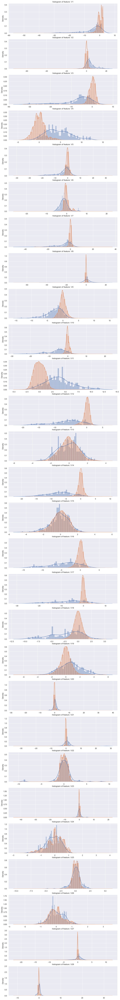

In [108]:
df_train = copy.deepcopy(df_train_original)
features = df_train.iloc[:, [x for x in range(1,29)]].columns
plt.figure(figsize=(12,28*4))

gs = gridspec.GridSpec(28, 1)
for i, c in enumerate(df_train[features]):
 ax = plt.subplot(gs[i])
 sns.distplot(df_train[c][df_train.Class == 1], bins=50)
 sns.distplot(df_train[c][df_train.Class == 0], bins=50)
 ax.set_xlabel('')
 ax.set_title('histogram of feature: ' + str(c))
plt.show()

In [109]:
Fraud = df_train[df_train['Class'] == 1]
Valid = df_train[df_train['Class'] == 0]
outlier_fraction = len(Fraud)/float(len(Valid))
print(outlier_fraction)
print('Fraud Cases: {}'.format(len(df_train[df_train['Class'] == 1])))
print('Valid Transactions: {}'.format(len(df_train[df_train['Class'] == 0])))

0.0017322412299792043
Fraud Cases: 394
Valid Transactions: 227451


In [110]:
print('Amount details of fraudulent transaction')
Fraud.Amount.describe()

Amount details of fraudulent transaction


count     394.000000
mean      127.306523
std       264.533907
min         0.000000
25%         1.000000
50%        11.395000
75%       106.385000
max      2125.870000
Name: Amount, dtype: float64

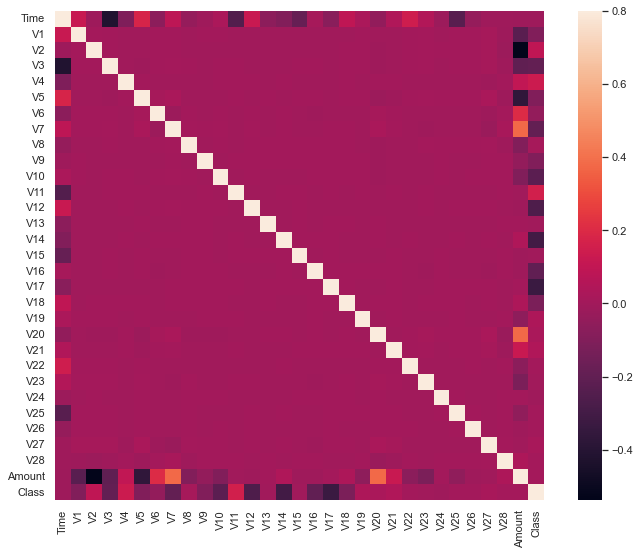

In [111]:
# Correlation matrix
corrmat = df_train.corr()
fig = plt.figure(figsize = (12, 9))
sns.heatmap(corrmat, vmax = .8, square = True)
plt.show()

Anomalies Detection using Isolation forest algorithm

In [112]:
y_data = df_train.pop('Class')
x_data = df_train
X_train, X_test, Y_train, Y_test = train_test_split(x_data, y_data, test_size = 0.2, random_state = 42)

In [113]:
ifc=IsolationForest(max_samples=len(X_train),contamination=outlier_fraction,random_state=1, n_jobs=4)
ifc.fit(X_train)
scores_pred = ifc.decision_function(X_train)
y_pred = ifc.predict(X_test)

C:\Users\PREETI\anaconda3\lib\site-packages\sklearn\base.py:450: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


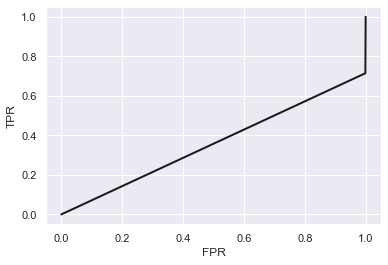

In [114]:
fpr, tpr, thresholds = roc_curve(Y_test,y_pred)
import matplotlib.pyplot as plt
plt.plot(fpr, tpr, 'k-', lw=2)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.show()

In [115]:
# np.set_printoptions(threshold=sys.maxsize)
ifc.score_samples(X_train)

array([-0.33111238, -0.34219728, -0.33014527, ..., -0.32617074,
       -0.32454384, -0.3225194 ])

In [116]:
ifc.decision_function(X_train)

array([0.19927989, 0.18819499, 0.200247  , ..., 0.20422153, 0.20584843,
       0.20787287])

In [117]:
y_score = -ifc.decision_function(X_train)

In [118]:
from sklearn.metrics import roc_auc_score
roc_auc_score(Y_train, y_score)

0.9565597852696466

95.6% score is thresold for Anomaly Detection

In [119]:
# Reshape the prediction values to 0 for valid, 1 for fraud. 
y_pred[y_pred == 1] = 0
y_pred[y_pred == -1] = 1
n_errors = (y_pred != Y_test).sum()

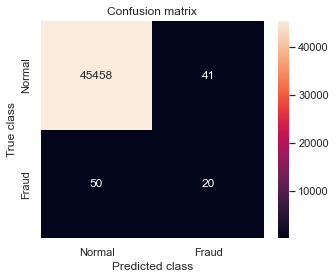

In [120]:
#printing the confusion matrix
LABELS = ['Genuine', 'Fraud']
conf_matrix = confusion_matrix(Y_test, y_pred)
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix, xticklabels=LABELS,
 yticklabels=LABELS, annot=True, fmt='d');
plt.title('Confusion matrix')
plt.ylabel('True class')
plt.xlabel('Predicted class')
plt.show()

From the confusion matrix above, we can see that the neural network detected around half of the fraudulent transactions, but misidentifed a few genuine transactions as fraudulent.

In [121]:
#evaluation of the model
#printing every score of the classifier
#scoring in any thing
from sklearn.metrics import confusion_matrix
n_outliers = len(Fraud)
print('The Model used is {}'.format('Isolation Forest'))
acc= accuracy_score(Y_test,y_pred)
print('The accuracy is {}'.format(acc))
prec= precision_score(Y_test,y_pred)
print('The precision is {}'.format(prec))
rec= recall_score(Y_test,y_pred)
print('The recall is {}'.format(rec))
f1= f1_score(Y_test,y_pred)
print('The F1-Score is {}'.format(f1))
MCC=matthews_corrcoef(Y_test,y_pred)
print('The Matthews correlation coefficient is {}'.format(MCC))

The Model used is Isolation Forest
The accuracy is 0.9980030283745529
The precision is 0.32786885245901637
The recall is 0.2857142857142857
The F1-Score is 0.30534351145038163
The Matthews correlation coefficient is 0.30507120439348184


<AxesSubplot:>

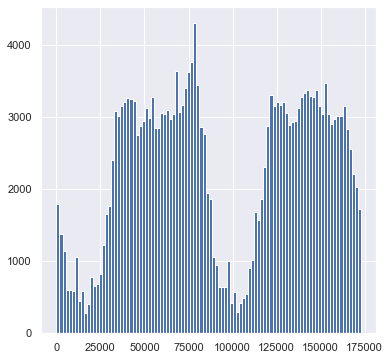

In [124]:
Valid["Time"].hist(bins=100, figsize=(6,6))

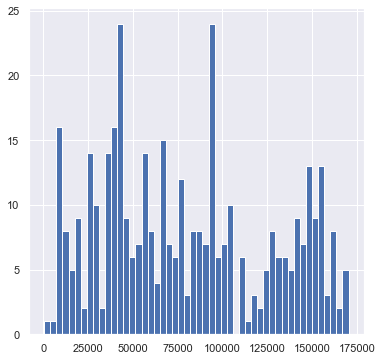

In [125]:
Fraud["Time"].hist(bins=50, figsize=(6,6));

Fradudlant transaction distrituion is during 2 days is highly skewed. On each day same amount fradulant transactions occured during same time duration of each day.

Anomalies Detection using quartiles

In [126]:
for x in df_train.columns.to_list()[1:29]:
    Q1 = np.percentile(df_train[x], 25, interpolation = 'midpoint') 
    # Third quartile (Q3) 
    Q3 = np.percentile(df_train[x], 75, interpolation = 'midpoint') 
    # Interquaritle range (IQR)
    IQR = Q3 - Q1 
    # print("IQR:",IQR*1.5, "|| Q3:",Q3,"|| Q1:",Q1)
    if IQR*1.5>Q3 or IQR*1.5<Q1:
        outliers_no = ((df_train[x] < (Q1 - 1.5 * IQR)) | (df_train[x] > (Q3 + 1.5 * IQR))).sum()
        print(x," have Anomalies and total no are: ",outliers_no )
    else:
        print(x," No Anomalies")

V1  have Anomalies and total no are:  5661
V2  have Anomalies and total no are:  10877
V3  have Anomalies and total no are:  2672
V4  have Anomalies and total no are:  8872
V5  have Anomalies and total no are:  9933
V6  have Anomalies and total no are:  18386
V7  have Anomalies and total no are:  7166
V8  have Anomalies and total no are:  19338
V9  have Anomalies and total no are:  6535
V10  have Anomalies and total no are:  7597
V11  have Anomalies and total no are:  619
V12  have Anomalies and total no are:  12277
V13  have Anomalies and total no are:  2737
V14  have Anomalies and total no are:  11252
V15  have Anomalies and total no are:  2291
V16  have Anomalies and total no are:  6486
V17  have Anomalies and total no are:  5968
V18  have Anomalies and total no are:  6033
V19  have Anomalies and total no are:  8054
V20  have Anomalies and total no are:  22193
V21  have Anomalies and total no are:  11614
V22  have Anomalies and total no are:  1033
V23  have Anomalies and total no ar

Above outcome shows that all transactional data has total anomalies/outliers associated with  every transactions and it varies from min-619 to max-31365

Visualize the scores for Fraudulent and Non-Fraudulent transactions.

ann_predictions

In [130]:
ann_prediction_copy = [1 if x>=0.5 else 0 for x in ann_predictions]
ann_prediction_series = pd.Series(ann_prediction_copy)
ann_prediction_series

0        0
1        0
2        0
3        0
4        0
        ..
56957    0
56958    0
56959    0
56960    0
56961    0
Length: 56962, dtype: int64

<AxesSubplot:>

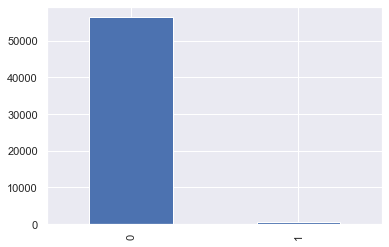

In [131]:
# ann_prediction_series.plot(kind='bar')
ann_prediction_series.value_counts().plot(kind='bar')

Predicted Hidden values

<AxesSubplot:>

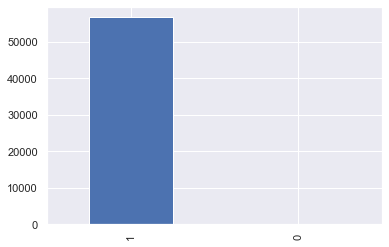

In [132]:
ann_prediction_hidden = [1 if x>=0.5 else 0 for x in ann_predictions_hidden]
ann_prediction_series_hidden = pd.Series(ann_prediction_hidden)
ann_prediction_series_hidden.value_counts().plot(kind='bar')

Original hidden values

<AxesSubplot:>

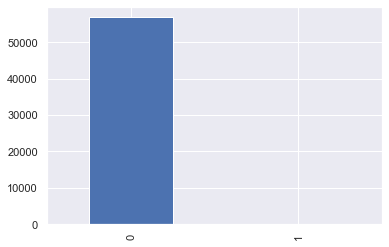

In [133]:
df_train_hidden['Class'].value_counts().plot(kind='bar')

Find out the threshold value for marking or reporting a transaction as fraudulent in your anomaly detection system.
For this kind of unbalanced dataset, it is more reasonable to look at Area Under ROC curve, since it has the nice property to be 0.5 for random scoring and 1.0 for perfect scoring whatever the balancing.
* 95.6% is auc score as threshold for Anoamly detection. Generated by Isolation forest.


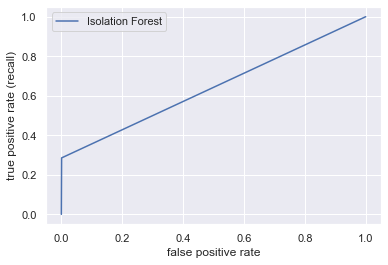

In [134]:
fp, tp, thres = roc_curve(Y_test,y_pred)
plt.plot(fp, tp, label="Isolation Forest")

# fp, tp, thres = roc_curve(y, np.random.rand(len(y)))
# plt.plot(fp, tp, label="Random")

plt.xlabel("false positive rate")
plt.ylabel("true positive rate (recall)")
plt.legend()

In [135]:
print("\n",fp,"\n\n",tp)


 [0.00000000e+00 9.01118706e-04 1.00000000e+00] 

 [0.         0.28571429 1.        ]


Can this score be used as an engineered feature in the models developed previously? Are there any incremental gains in F1-Score? Why or Why not?
* F1 takes both false positives and false negatives into consideration. In imbalanced classes such as this, F1 is much more effective than accuracy at determining the performance of the model.
* F1 score for neural network model is better than traditional Machine Learning model.
Be as creative as possible in finding other interesting insights.¶


Be as creative as possible in finding other interesting insights.

In [137]:
df_train = copy.deepcopy(df_train_original)
df_train

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,38355.0,1.043949,0.318555,1.045810,2.805989,-0.561113,-0.367956,0.032736,-0.042333,-0.322674,...,-0.240105,-0.680315,0.085328,0.684812,0.318620,-0.204963,0.001662,0.037894,49.67,0
1,22555.0,-1.665159,0.808440,1.805627,1.903416,-0.821627,0.934790,-0.824802,0.975890,1.747469,...,-0.335332,-0.510994,0.035839,0.147565,-0.529358,-0.566950,-0.595998,-0.220086,16.94,0
2,2431.0,-0.324096,0.601836,0.865329,-2.138000,0.294663,-1.251553,1.072114,-0.334896,1.071268,...,0.012220,0.352856,-0.341505,-0.145791,0.094194,-0.804026,0.229428,-0.021623,1.00,0
3,86773.0,-0.258270,1.217501,-0.585348,-0.875347,1.222481,-0.311027,1.073860,-0.161408,0.200665,...,-0.424626,-0.781158,0.019316,0.178614,-0.315616,0.096665,0.269740,-0.020635,10.78,0
4,127202.0,2.142162,-0.494988,-1.936511,-0.818288,-0.025213,-1.027245,-0.151627,-0.305750,-0.869482,...,0.010115,0.021722,0.079463,-0.480899,0.023846,-0.279076,-0.030121,-0.043888,39.96,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
227840,62074.0,-1.993953,1.734986,-1.108037,-2.671817,1.605319,3.041992,-0.417771,1.438007,0.945437,...,-0.303532,-0.708199,0.047110,1.008409,0.234363,0.768581,0.697625,0.354542,14.83,0
227841,32193.0,-0.440396,1.062920,1.582218,-0.029761,0.040967,-0.903627,0.730326,-0.108175,-0.513163,...,-0.215794,-0.532224,-0.024762,0.382581,-0.164620,0.068836,0.269144,0.123483,2.58,0
227842,163864.0,0.827820,-2.649344,-3.161235,0.209209,-0.561331,-1.570386,1.612531,-0.930219,-1.318562,...,0.349915,0.002268,-0.746698,0.171847,0.247576,0.936557,-0.258164,0.037868,748.04,0
227843,122571.0,-1.523903,-6.287060,-2.638246,1.330015,-1.672002,1.957509,1.359226,0.081727,0.753151,...,1.329127,0.001210,-1.360187,-1.507703,-1.183927,0.578076,-0.328557,0.229935,1771.50,0


<AxesSubplot:>

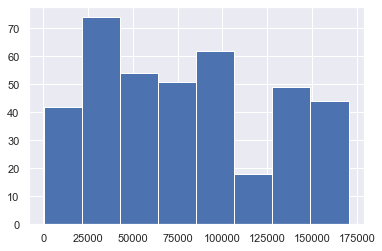

In [138]:
df_train[df_train['Class']==1].Time.hist(bins=8)

<AxesSubplot:>

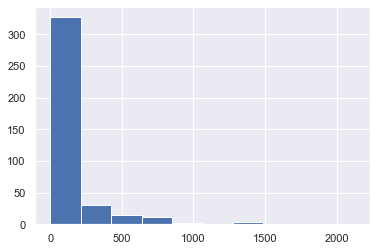

In [139]:
df_train[df_train['Class']==1].Amount.hist(bins=10)

In [140]:
df_train[df_train['Class']==1].Amount

266        11.38
360       316.06
421         0.01
734         0.00
854         1.00
           ...  
226409    175.90
226814    362.55
226817      1.00
226957      1.00
227531      1.00
Name: Amount, Length: 394, dtype: float64

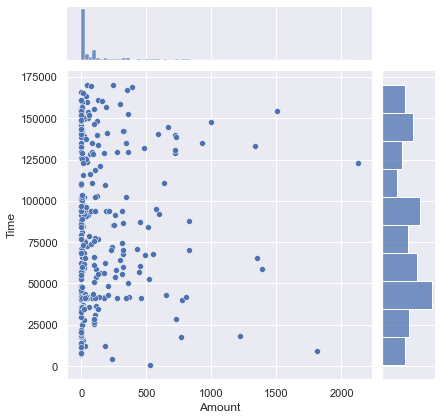

In [141]:
sns.jointplot(x="Amount", y="Time", data=df_train[df_train['Class']==1])

Attempt was made to run ANN model with 1 hidden layer and F1 Score calculated for that model. 
After that following code was implemented to test the hypothesis w.r.t. following

If the Null Hypothesis is accepted, this means there is no difference between the datasets and the change of number of hidden layers does not affect the performance of the model.
    
If the Null Hypothesis is rejected, this means there is significant difference between the datasets and the change of number of hidden layers affects the performance of the model.

In [ ]:
#Wilcoxon Signed-Rank Test
#It tests the null hypothesis that two related paired samples come from the same distribution.
#It is a non-parametric version of the paired T-test.

#s, p = stats.wilcoxon(fscore_df1[0], fscore_df2[0])

#if p < 0.05:
  print('null hypothesis rejected, significant difference between the data-sets')
#else:
#  print('null hypothesis accepted, no significant difference between the data-sets')

Result analysis was found that null hypotheis rejected and there is significant difference between datasets